In [69]:
import pandas as pd
import altair as alt
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.feature_selection import f_regression

In [5]:
data = pd.read_csv('data/profiles.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59946 entries, 0 to 59945
Data columns (total 31 columns):
age            59946 non-null int64
body_type      54650 non-null object
diet           35551 non-null object
drinks         56961 non-null object
drugs          45866 non-null object
education      53318 non-null object
essay0         54458 non-null object
essay1         52374 non-null object
essay2         50308 non-null object
essay3         48470 non-null object
essay4         49409 non-null object
essay5         49096 non-null object
essay6         46175 non-null object
essay7         47495 non-null object
essay8         40721 non-null object
essay9         47343 non-null object
ethnicity      54266 non-null object
height         59943 non-null float64
income         59946 non-null int64
job            51748 non-null object
last_online    59946 non-null object
location       59946 non-null object
offspring      24385 non-null object
orientation    59946 non-null object
pets

60,000 rows, 31 columns.

10 essays and the rest are -- presumably -- multiple choice.

### What's in these columns?

In [26]:
rows = []
for col in data.columns:
    # Skip essay columns
    if 'essay' in col: continue
    # Get number of distinct values
    n_distinct = data[col].unique().shape[0]
    # Get pct null
    pct_null = data[pd.isnull(data[col])].shape[0] / data.shape[0] * 100
    # Get a sample entry
    sample_val = data[pd.notnull(data[col])].sample(1)[col].iloc[0]
    rows.append((col, n_distinct, pct_null, sample_val))
# Put it all in a DataFrame and display it nicely
col_summary = pd.DataFrame(rows, columns=['column', 'n_distinct', 'pct_null', 'sample'])
col_summary.sort_values('pct_null').reset_index()

,index,column,n_distinct,pct_null,sample
0,0,age,54,0.000000,38
1,16,sex,2,0.000000,m
2,13,orientation,3,0.000000,straight
3,11,location,199,0.000000,"berkeley, california"
4,8,income,13,0.000000,-1
5,10,last_online,30123,0.000000,2012-06-30-11-49
6,20,status,5,0.000000,single
7,7,height,61,0.005005,63
8,19,speaks,7648,0.083408,english
9,3,drinks,7,4.979482,socially


So we have full coverage of *age*, *sex*, *orientation*, *location*, *income*, *last_online*, and *status*.
And decent coverage of most of the rest.

Things get spotty at sign -- *sign*, *drugs*, *pets*, *religion*, and diet aren't great.
And offspring is so bad we probably should just get rid of it.

### Plotting
Let's start some viz.

#### Income

/anaconda3/envs/ad_hoc/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


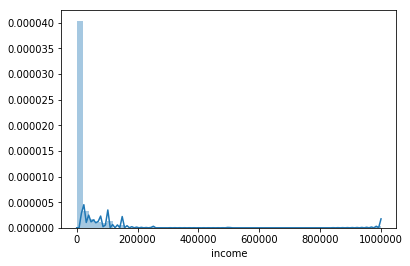

In [31]:
sns.distplot(data['income'])

There are a couple of really rich people here....

#### Height and Income

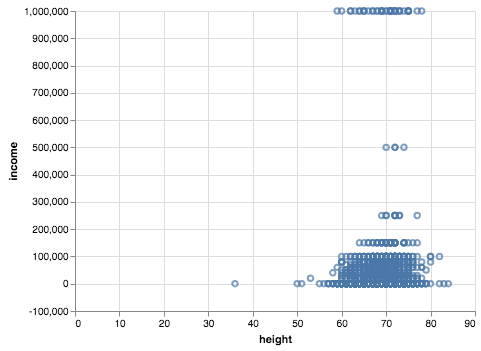

In [32]:
alt.Chart(data.sample(5000)).mark_point().encode(
    x='height',
    y='income'
)

This isn't super illuminating.

Let's get a line of best fit.

In [73]:
model = LinearRegression()
# Drop rows that have nulls.
valid_data = data[pd.notnull(data['height']) & pd.notnull(data['income'])]
model.fit(X=valid_data[['height']], y=valid_data['income'])
m = model.coef_[0]
b = model.intercept_

y_pred = model.predict(valid_data[['height']])
r2 = r2_score(y_true=valid_data['income'], y_pred=y_pred)

F, p = f_regression(valid_data[['height']], valid_data['income'])

print(f'm={m}, b={b}, r2={r2}, p_value={p[0]}')

m=1585.164622933284, b=-88225.03739077503, r2=0.004231367600946667, p_value=3.204188130191021e-57


An inch of height is worth $1500 of salary!

Nah, probably not, this is probably capturing gender.
Let's try it just for men.

In [80]:
model = LinearRegression()
# Drop rows that have nulls.
valid_data = data[pd.notnull(data['height']) & pd.notnull(data['income'])]
# Keep only men
valid_data = valid_data[valid_data['sex'] == 'm']
model.fit(X=valid_data[['height']], y=valid_data['income'])
m = model.coef_[0]
b = model.intercept_

y_pred = model.predict(valid_data[['height']])
r2 = r2_score(y_true=valid_data['income'], y_pred=y_pred)

F, p = f_regression(valid_data[['height']], valid_data['income'])

print(f'm={m}, b={b}, r2={r2}, p_value={p[0]}')

m=665.8054825458464, b=-20908.904762722912, r2=0.00034771943144451534, p_value=0.000415973453147955


Still significant and large ($650 an inch) -- do taller men make more money, or are taller men just more likely to lie?

Let's look at women.

In [81]:
model = LinearRegression()
# Drop rows that have nulls.
valid_data = data[pd.notnull(data['height']) & pd.notnull(data['income'])]
# Keep only men
valid_data = valid_data[valid_data['sex'] == 'f']
model.fit(X=valid_data[['height']], y=valid_data['income'])
m = model.coef_[0]
b = model.intercept_

y_pred = model.predict(valid_data[['height']])
r2 = r2_score(y_true=valid_data['income'], y_pred=y_pred)

F, p = f_regression(valid_data[['height']], valid_data['income'])

print(f'm={m}, b={b}, r2={r2}, p_value={p[0]}')

m=729.6105797209202, b=-36318.313386877264, r2=0.0008291679053991086, p_value=7.734364509881855e-06


Again, and an even bigger effect!

Let's take a look at this effect (for women) in a viz.

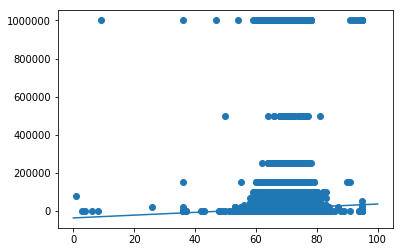

In [82]:
x1, x2 = 0, 100
y1 = m * x1 + b
y2 = m * x2 + b
plt.plot((x1, x2), (y1, y2))
plt.scatter(data['height'], data['income'])

Looks kind of meaningless in this context, now that we can see how high the values go.